#PreProcessing and imports

In [1]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import os
from PIL import Image

In [4]:
device= "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [5]:
def get_image_path(root, folder="Train", type="Degraded_image" ): #returns paths of all the images from the given folder
 root=root+"/drive/MyDrive"
 dataset_path=os.path.join(root, "Denoising_Dataset_train_val")
 print("zeroeth print statement")
 print(os.listdir(dataset_path))
 image_paths=[]
#go inside each of the object directories, for each of them
#go inside Train folder,
#inside train, go inside gthe Degraded_image directory,
#inside Degraded_image directory, there are different directories,
#inside each of these directories there are images that we have to extract, which are basically our noised image
 for object in sorted(os.listdir(dataset_path)):
    object_directory_path=os.path.join(root, "Denoising_Dataset_train_val", object)
    # print("First print statement")
    # print(os.listdir(object_directory_path))


    for train_folder in sorted(os.listdir(object_directory_path)):
      if(train_folder==folder):
        train_directory_path=os.path.join(root, "Denoising_Dataset_train_val", object, train_folder)
        # print("second print staement")
        # print(os.listdir(train_directory_path))

        for degraded_image_folder in os.listdir(train_directory_path):
            if(degraded_image_folder==type):

                image_folder_path=os.listdir(os.path.join(root, "Denoising_Dataset_train_val", object, train_folder, degraded_image_folder))
                # print("third print statement")
                # print(image_folder_path)
                # return []
                for image_folder in sorted(image_folder_path):
                    #inside each image folder, get the images and store them in images list
                    # print(image_folder_path)
                    image_path=os.listdir(os.path.join(root, "Denoising_Dataset_train_val", object, train_folder, degraded_image_folder, image_folder))
                    # print("fourth print statement")
                    # image_path.sort()
                    # print(image_path)
                    # return []
                    for image in sorted(image_path):
                        #now we need to store these images in a list so that they can be accessed later
                        image_paths.append(os.path.join(root, "Denoising_Dataset_train_val", object, train_folder, degraded_image_folder, image_folder, image))
 return image_paths

In [6]:
degraded_train_image_paths=get_image_path(os.getcwd())


zeroeth print statement
['metal_nut', 'transistor', 'zipper', 'screw', 'tile', 'pill', 'toothbrush', 'leather', 'wood', 'hazelnut', 'cable', 'capsule', 'carpet', 'grid', 'bottle']


In [7]:
clean_train_image_paths=get_image_path(os.getcwd(), "Train", type="GT_clean_image")
# len(degraded_train_image_paths), len(clean_train_image_paths)

zeroeth print statement
['metal_nut', 'transistor', 'zipper', 'screw', 'tile', 'pill', 'toothbrush', 'leather', 'wood', 'hazelnut', 'cable', 'capsule', 'carpet', 'grid', 'bottle']


In [8]:
#now we need to have a function that can load a given image as a matrix
degraded_test_image=np.array(Image.open(degraded_train_image_paths[0]))
clean_test_image=np.array(Image.open(clean_train_image_paths[0]))

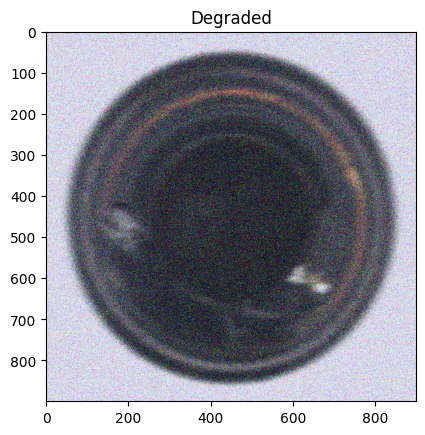

In [9]:
plt.imshow(degraded_test_image)
plt.title("Degraded")
plt.show()

In [10]:
clean_train_image_paths[0]

'/content/drive/MyDrive/Denoising_Dataset_train_val/bottle/Train/GT_clean_image/broken_large/001.png'

In [11]:
# bilateral_image=np.array(Image.open("d:\\Pc\\Documents\\200 Project\\denoised_bilateral\\Denoising_Dataset_train_val_bottle_Train_Degraded_image_broken_large_001_output.png"))
# plt.imshow(bilateral_image)
# plt.title("Bilateral image")
# plt.show()

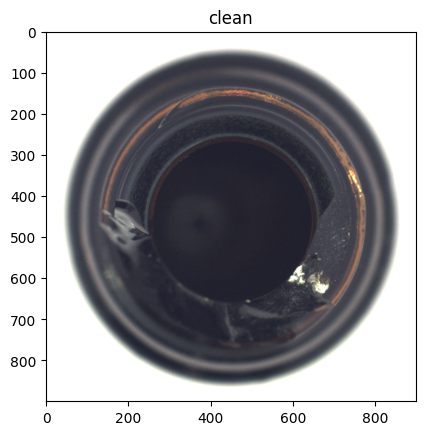

In [12]:
plt.imshow(clean_test_image)
plt.title("clean")
plt.show()

#### looks like we are good to go, some more preprocessing and then maybe we can train a basic autoencoder on these images. However, for the clean images, we have one less image than the degraded ones. 932 to degraded images' 933, maybe write a script to find which one it is and then delete that image from both the lists

`to achieve this we will get the names of images in degraded list and clean list and get the one that does not match, get its index`

In [13]:
def get_image_file_names(image_list):
    image_names=[]
    for image_path in image_list:
        image_names.append(image_path[-7:])

    return image_names

In [14]:
degraded_train_image_names=get_image_file_names(degraded_train_image_paths)
clean_train_image_names=get_image_file_names(clean_train_image_paths)

In [15]:
len(clean_train_image_names),len(degraded_train_image_names) #one image is missing from clean_dataset which could actually alter the ground truth of every following image

(932, 933)

In [16]:
#get index of the image that is missing from clean_train_images
for i in range(len(degraded_train_image_names)):
    if clean_train_image_names[i] != degraded_train_image_names[i]:
        print(i)
        break

91


In [17]:
clean_train_image_names[91], degraded_train_image_names[91] #clean image is missing: 001.png, therefore we must remove image at index 91 from degraded_train_image_names

('002.png', '001.png')

In [18]:
clean_train_image_names[90], degraded_train_image_names[90]

('000.png', '000.png')

In [19]:
Image.open(degraded_train_image_paths[92]).size

(1024, 1024)

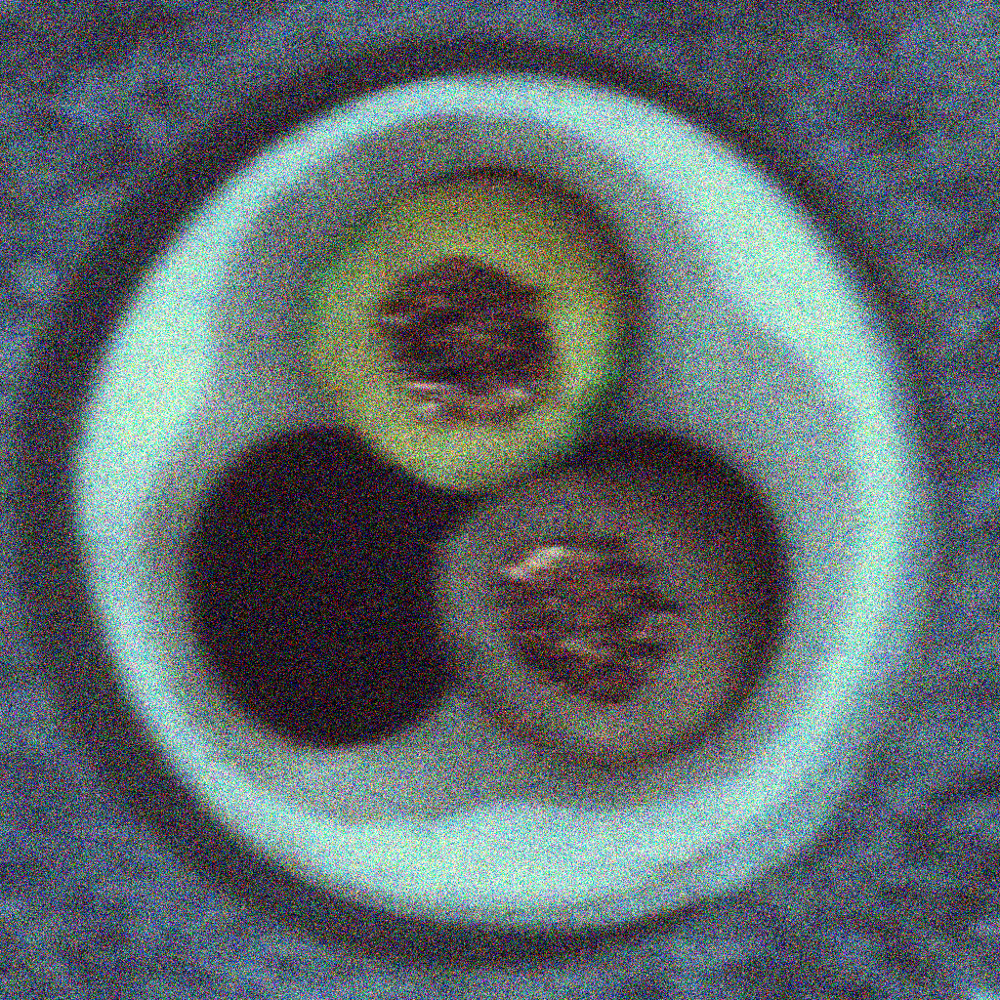

In [20]:
Image.open(degraded_train_image_paths[92])

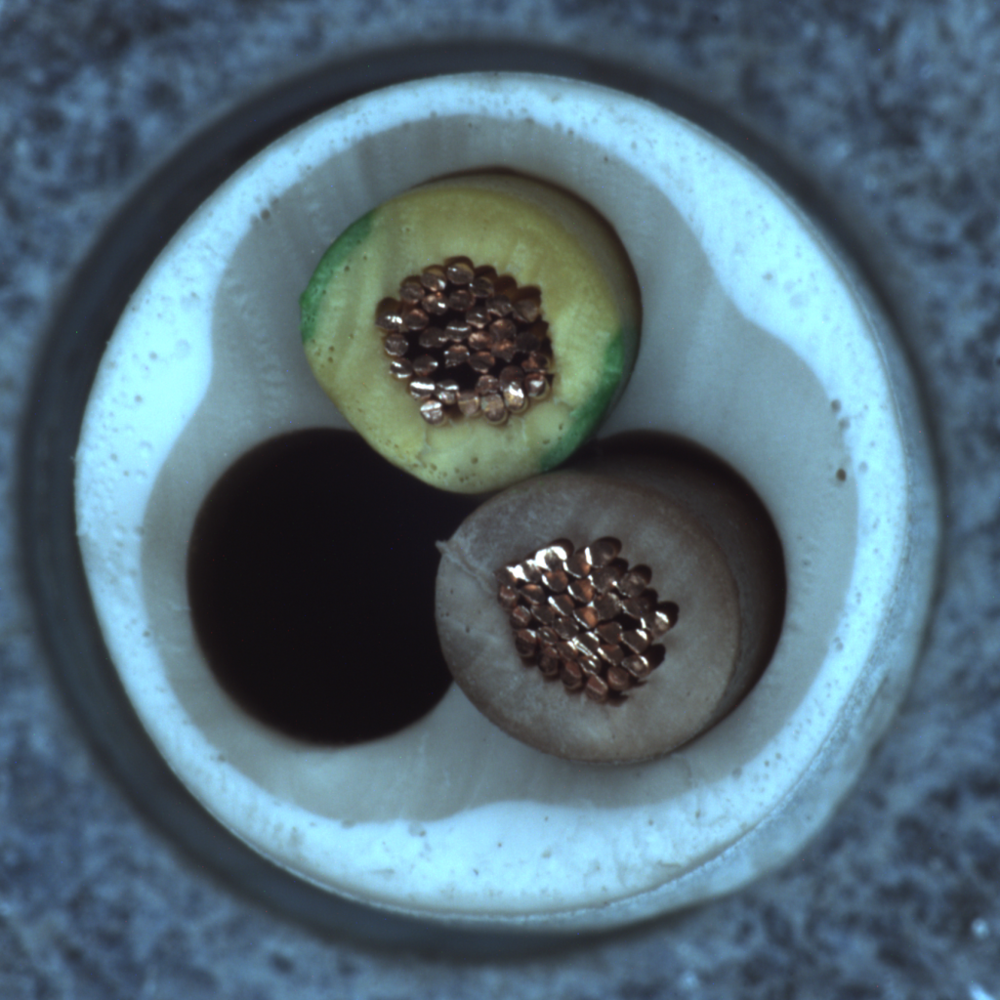

In [21]:
Image.open(clean_train_image_paths[91]) #clean image for index 92 of degraded_image

In [22]:
value_to_remove=degraded_train_image_paths[91]
degraded_train_image_paths.remove(value_to_remove)

In [23]:
len(degraded_train_image_paths), len(clean_train_image_paths)

(932, 932)

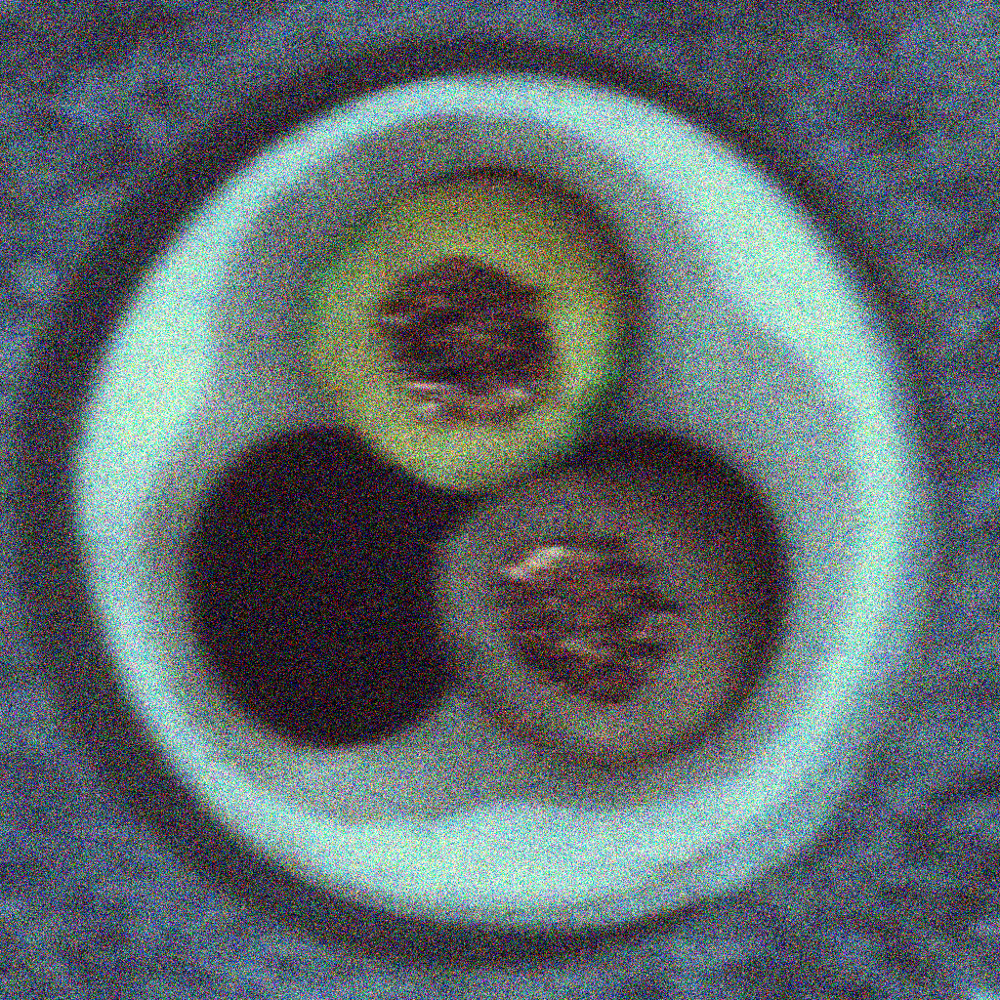

In [ ]:
Image.open(degraded_train_image_paths[91])

## Now we must load these images into a Dataloader object, similar to how we usually do

In [ ]:
np.array(Image.open(clean_train_image_paths[0])).shape

(900, 900, 3)

In [24]:
#all images are not of the same dimension, therfore we must do appropriate padding, for each image to make all of them
#of the size 1024x1024, which is the size of the largest image
def get_images_dimensions(image_paths):
    images=[]
    different_widths=[]
    different_heights=[]
    max_height=0
    max_width=0
    for path in image_paths:
        arr=np.array(Image.open(path))
        height=arr.shape[0]
        width=arr.shape[1]
        if height not in different_heights:
            different_heights.append(height)
        if width not in different_widths:
            different_widths.append(width)
        max_height = height if height>max_height else max_height
        max_width= width if width>max_width else max_width
    print("different widhts", different_widths)
    print("Different heights", different_heights)
    print("Max height of an image is ", max_height, "max width of an image is ", max_width)

In [ ]:
# get_images_dimensions(degraded_train_image_paths)
# get_images_dimensions(clean_train_image_paths)

#Model defination and dataloading

model copied from a github repo: the repo has been downloaded in DenoisingAutoencoder

In [ ]:
#ARchitecture for AE Model--> Works alright, but we aren;t using this
# import torch
# import torch.nn as nn

# class Conv2DLayer(nn.Module):
#     def __init__(self, in_channels, out_channels, kernel_size, stride, padding, block_id):
#         super(Conv2DLayer, self).__init__()
#         self.block_id = block_id

#         self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding)
#         nn.init.orthogonal_(self.conv.weight)
#         self.lrelu = nn.LeakyReLU()
#         self.dropout = nn.Dropout2d(0.2)
#         self.bn = nn.BatchNorm2d(out_channels)

#     def forward(self, x):
#         x = self.conv(x)
#         x = self.lrelu(x)
#         x = self.dropout(x)
#         x = self.bn(x)
#         return x

# class TransposeConv2D(nn.Module):
#     def __init__(self, in_channels, out_channels, kernel_size, stride, padding, block_id):
#         super(TransposeConv2D, self).__init__()
#         self.block_id = block_id

#         self.deconv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding)
#         nn.init.orthogonal_(self.deconv.weight)
#         self.lrelu = nn.LeakyReLU()
#         self.dropout = nn.Dropout2d(0.2)
#         self.bn = nn.BatchNorm2d(out_channels)

#     def forward(self, x):
#         x = self.deconv(x)
#         x = self.lrelu(x)
#         x = self.dropout(x)
#         x = self.bn(x)
#         return x

# class AutoEncoder(nn.Module):
#     def __init__(self):
#         super(AutoEncoder, self).__init__()

#         # Encoder
#         self.conv1 = Conv2DLayer(3, 64, 3, stride=1, padding=1, block_id=1)  # 256x256
#         self.conv2 = Conv2DLayer(64, 64, 3, stride=2, padding=1, block_id=2)  # 128x128
#         self.conv3 = Conv2DLayer(64, 128, 5, stride=2, padding=2, block_id=3)  # 64x64
#         self.conv4 = Conv2DLayer(128, 128, 3, stride=1, padding=1, block_id=4)  # 64x64
#         self.conv5 = Conv2DLayer(128, 256, 5, stride=2, padding=2, block_id=5)  # 32x32
#         self.conv6 = Conv2DLayer(256, 512, 3, stride=2, padding=1, block_id=6)  # 16x16

#         # Decoder
#         self.deconv1 = TransposeConv2D(512, 512, 3, stride=2, padding=1, block_id=7)  # 32x32
#         self.conv7 = Conv2DLayer(512 + 256, 256, 3, stride=1, padding=1, block_id=8)
#         self.deconv2 = TransposeConv2D(256, 128, 3, stride=2, padding=1, block_id=9)  # 64x64
#         self.conv8 = Conv2DLayer(128 + 128, 128, 5, stride=1, padding=2, block_id=10)
#         self.deconv3 = TransposeConv2D(128, 64, 3, stride=2, padding=1, block_id=11)  # 128x128
#         self.conv9 = Conv2DLayer(64 + 64, 64, 5, stride=1, padding=2, block_id=12)
#         self.deconv4 = TransposeConv2D(64, 64, 3, stride=2, padding=1, block_id=13)  # 256x256

#         # Final convolution
#         self.final_conv = nn.Conv2d(64 + 64, 3, 3, stride=1, padding=1)
#         nn.init.orthogonal_(self.final_conv.weight)

#     def match_sizes(self, x1, x2):
#         """Match sizes by padding the smaller tensor"""
#         if x1.shape != x2.shape:
#             # For height
#             if x1.shape[2] < x2.shape[2]:
#                 diff_h = x2.shape[2] - x1.shape[2]
#                 padding_h = (diff_h//2, diff_h - diff_h//2)
#                 x1 = nn.functional.pad(x1, (0, 0, padding_h[0], padding_h[1]))
#             elif x2.shape[2] < x1.shape[2]:
#                 diff_h = x1.shape[2] - x2.shape[2]
#                 padding_h = (diff_h//2, diff_h - diff_h//2)
#                 x2 = nn.functional.pad(x2, (0, 0, padding_h[0], padding_h[1]))

#             # For width
#             if x1.shape[3] < x2.shape[3]:
#                 diff_w = x2.shape[3] - x1.shape[3]
#                 padding_w = (diff_w//2, diff_w - diff_w//2)
#                 x1 = nn.functional.pad(x1, (padding_w[0], padding_w[1], 0, 0))
#             elif x2.shape[3] > x1.shape[3]:
#                 diff_w = x2.shape[3] - x1.shape[3]
#                 padding_w = (diff_w//2, diff_w - diff_w//2)
#                 x2 = nn.functional.pad(x2, (padding_w[0], padding_w[1], 0, 0))

#         return x1, x2

#     def forward(self, x):
#         # Store input size for later
#         input_size = x.shape

#         # Encoder
#         conv1 = self.conv1(x)
#         conv2 = self.conv2(conv1)
#         conv3 = self.conv3(conv2)
#         conv4 = self.conv4(conv3)
#         conv5 = self.conv5(conv4)
#         conv6 = self.conv6(conv5)

#         # Decoder with skip connections and size matching
#         deconv1 = self.deconv1(conv6)
#         deconv1, conv5_matched = self.match_sizes(deconv1, conv5)
#         skip1 = torch.cat([deconv1, conv5_matched], dim=1)
#         conv7 = self.conv7(skip1)

#         deconv2 = self.deconv2(conv7)
#         deconv2, conv3_matched = self.match_sizes(deconv2, conv3)
#         skip2 = torch.cat([deconv2, conv3_matched], dim=1)
#         conv8 = self.conv8(skip2)

#         deconv3 = self.deconv3(conv8)
#         deconv3, conv2_matched = self.match_sizes(deconv3, conv2)
#         skip3 = torch.cat([deconv3, conv2_matched], dim=1)
#         conv9 = self.conv9(skip3)

#         deconv4 = self.deconv4(conv9)
#         deconv4, conv1_matched = self.match_sizes(deconv4, conv1)
#         skip4 = torch.cat([deconv4, conv1_matched], dim=1)

#         out = torch.sigmoid(self.final_conv(skip4))

#         # Ensure output size matches input size
#         if out.shape != input_size:
#             out = nn.functional.interpolate(out, size=(input_size[2], input_size[3]), mode='bilinear', align_corners=True)

#         return out

Another model DnCNN from a paper written in 2016--> this is the one that we have actually used

In [25]:
import torch.nn.init as init


class DnCNN(nn.Module):
    def __init__(self, depth=17, n_channels=64, image_channels=1, use_bnorm=True, kernel_size=3):
        super(DnCNN, self).__init__()
        kernel_size = 3
        padding = 1
        layers = []

        layers.append(nn.Conv2d(in_channels=image_channels, out_channels=n_channels, kernel_size=kernel_size, padding=padding, bias=True))
        layers.append(nn.ReLU(inplace=True))
        for _ in range(depth-2):
            layers.append(nn.Conv2d(in_channels=n_channels, out_channels=n_channels, kernel_size=kernel_size, padding=padding, bias=False))
            layers.append(nn.BatchNorm2d(n_channels, eps=0.0001, momentum = 0.95))
            layers.append(nn.ReLU(inplace=True))
        layers.append(nn.Conv2d(in_channels=n_channels, out_channels=image_channels, kernel_size=kernel_size, padding=padding, bias=False))
        self.dncnn = nn.Sequential(*layers)
        self._initialize_weights()

    def forward(self, x):
        y = x
        out = self.dncnn(x)
        denoised_output = y - out
        return torch.clamp(denoised_output, 0, 1)

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                init.orthogonal_(m.weight)
                print('init weight')
                if m.bias is not None:
                    init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm2d):
                init.constant_(m.weight, 1)
                init.constant_(m.bias, 0)

In [26]:
model2=DnCNN(depth=17, n_channels=64,image_channels=3).to(device)
loss_fn=nn.MSELoss()
optimizer=torch.optim.Adam(model2.parameters(), lr=0.0001)

init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight


##Setting up Dataset and DataLoader Objects

In [27]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import numpy as np
# def convert_gray_to_rgb(image):
#     # Handle both PIL Image and numpy array inputs
#     if isinstance(image, np.ndarray):
#         return np.stack([image] * 3, axis=-1)
#     return Image.merge('RGB', [image]*3)

def convert_gray_to_rgb(image):
    # Check if input is a numpy array
    if isinstance(image, np.ndarray):
        # If already RGB (3 channels), return as is
        if image.ndim == 3 and image.shape[-1] == 3:
            return image
        # Otherwise, convert grayscale to RGB
        return np.stack([image] * 3, axis=-1)

    # For PIL Images, check if already RGB
    if image.mode == 'RGB':
        return image
    # Convert grayscale to RGB
    return Image.merge('RGB', [image] * 3)


def resize(image):
    # Assuming you want to resize to 256x256 - adjust size if needed
    if isinstance(image, np.ndarray):
        return Image.fromarray(image).resize((256, 256), Image.Resampling.BILINEAR)
    return image.resize((256, 256), Image.Resampling.BILINEAR)

# Define the transforms
transform = transforms.Compose([
    transforms.Lambda(convert_gray_to_rgb),
    transforms.Lambda(resize),
    transforms.ToTensor(),
])

class SimpleDataset(Dataset):
    def __init__(self, noisy_paths, clean_paths, transform=transform):
        self.noisy_paths = noisy_paths
        self.clean_paths = clean_paths
        self.transform = transform

    def __len__(self):
        return len(self.noisy_paths)

    def __getitem__(self, idx):
        noisy_image = Image.open(self.noisy_paths[idx])
        clean_image = Image.open(self.clean_paths[idx])

        noisy_tensor = self.transform(noisy_image)
        clean_tensor = self.transform(clean_image)

        return noisy_tensor, clean_tensor

# Create the dataset and dataloader
original_train_dataset = SimpleDataset(degraded_train_image_paths, clean_train_image_paths)
# train_dataloader = DataLoader(dataset, batch_size=8, shuffle=True, num_workers=0)

##We must perform some data augmentation to get more data basically

In [73]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import random
import numpy as np
import torch.nn.functional as F
#applies the same transformation to both the images
class AugmentedDenoiseDataset(Dataset):
    def __init__(self, original_dataset, augment_size=4, crop_size=128):
        self.original_dataset = original_dataset
        self.augment_size = augment_size
        self.crop_size = crop_size

        # Define spatial transforms for PIL images (without ToTensor here)
        self.spatial_transforms = transforms.Compose([
            transforms.RandomHorizontalFlip(),
            transforms.RandomVerticalFlip(),
            transforms.RandomRotation(degrees=30),
        ])

    def __len__(self):
        return len(self.original_dataset) * self.augment_size

    def random_crop(self, clean, noisy, size=None):
        """Random crop both clean and noisy images at the same position"""
        if size is None:
            size = self.crop_size

        if clean.dim() == 3:
            clean = clean.unsqueeze(0)
        if noisy.dim() == 3:
            noisy = noisy.unsqueeze(0)

        _, _, h, w = clean.shape
        if h < size or w < size:
            scale = size / min(h, w)
            new_h = int(h * scale)
            new_w = int(w * scale)
            clean = F.interpolate(clean, size=(new_h, new_w), mode='bilinear', align_corners=False)
            noisy = F.interpolate(noisy, size=(new_h, new_w), mode='bilinear', align_corners=False)
            h, w = new_h, new_w

        top = random.randint(0, h - size) if h > size else 0
        left = random.randint(0, w - size) if w > size else 0

        clean = clean[:, :, top:top + size, left:left + size]
        noisy = noisy[:, :, top:top + size, left:left + size]

        return clean.squeeze(0), noisy.squeeze(0)

    def apply_transforms(self, clean, noisy, rotate_degree=0):
        """Apply the same spatial transforms to both images"""
        # Convert tensors to PIL images for transforms
        clean_pil = transforms.ToPILImage()(clean)
        noisy_pil = transforms.ToPILImage()(noisy)

        # Apply horizontal and vertical flips
        if random.random() > 0.5:
            clean_pil = transforms.functional.hflip(clean_pil)
            noisy_pil = transforms.functional.hflip(noisy_pil)

        if random.random() > 0.5:
            clean_pil = transforms.functional.vflip(clean_pil)
            noisy_pil = transforms.functional.vflip(noisy_pil)

        # Apply rotation
        if rotate_degree != 0:
            clean_pil = clean_pil.rotate(rotate_degree)
            noisy_pil = noisy_pil.rotate(rotate_degree)

        # Convert back to tensors
        clean = transforms.ToTensor()(clean_pil)
        noisy = transforms.ToTensor()(noisy_pil)

        return clean, noisy

    def ensure_size(self, clean, noisy):
        """Ensure both images are exactly crop_size x crop_size"""
        if clean.shape[-2:] != (self.crop_size, self.crop_size):
            clean = F.interpolate(clean.unsqueeze(0),
                                  size=(self.crop_size, self.crop_size),
                                  mode='bilinear',
                                  align_corners=False).squeeze(0)
            noisy = F.interpolate(noisy.unsqueeze(0),
                                  size=(self.crop_size, self.crop_size),
                                  mode='bilinear',
                                  align_corners=False).squeeze(0)
        return clean, noisy

    def __getitem__(self, idx):
        orig_idx = idx // self.augment_size
        noisy, clean = self.original_dataset[orig_idx]

        # Generate transformation parameters
        rotate_degree = random.randint(-30, 30) if idx % self.augment_size != 0 else 0  # Apply rotation only for some augmentations

        # Apply transformations uniformly
        clean, noisy = self.apply_transforms(clean, noisy, rotate_degree)

        # Random crop
        clean, noisy = self.random_crop(clean, noisy)

        # Final size check to ensure consistent dimensions
        clean, noisy = self.ensure_size(clean, noisy)

        return noisy, clean

# Usage example:
augmented_dataset = AugmentedDenoiseDataset(original_train_dataset, augment_size=4, crop_size=256)
train_dataloader = DataLoader(augmented_dataset, batch_size=16, shuffle=True, num_workers=4) #for first 135 epochs, the batch size was kept 16, however it started osciallating a lot, so we increased the size now



In [74]:
len(train_dataloader)

233

In [75]:
# model=AutoEncoder().to(device)
# loss_fn=nn.MSELoss()
# optimizer=torch.optim.Adam(model.parameters(), lr=0.0001)

In [76]:
torch.cuda.empty_cache()

#Training

####Training the AE Model

In [77]:
# #train the model --> finally
# # model.train()
# epochs=50

# for epoch in range(epochs):
#     loss_per_batch=0
#     torch.cuda.empty_cache()
#     print("Epoch", epoch+1)
#     for i, images in enumerate(train_dataloader):
#         print("batch ", i+1)
#         noisy=images[0].to(device)
#         clean=images[1].to(device)
#         #forward pass
#         reconstructed=model(noisy)
#         # print("reconstructed_shape is ", reconstructed.shape)
#         #loss calc
#         loss=loss_fn(reconstructed, clean)
#         loss_per_batch+=loss
#         #zero the gradients
#         optimizer.zero_grad()

#         #backprop
#         loss.backward()

#         #update the weights
#         optimizer.step()
#         if i % 100 == 0:
#             torch.cuda.empty_cache()
#             print("100 batches done for the current epoch")

#     print(f"loss per batch for epoch {epoch+1} is {loss_per_batch}")


In [ ]:
# from google.colab import files
# torch.save(model.state_dict(), 'AE_model_50_epochs_augmenteted.pth')
# files.download('AE_model_50_epochs_augmenteted.pth')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

`Load our saved model and test`

In [ ]:
# Load the saved model weights
model.load_state_dict(torch.load('AE_modelRGB_20_epochs.pth'))
model.eval()  # Set the model to evaluation mode (optional, depending on your needs)

### Training the DnCNN

In [78]:
model2=DnCNN(depth=17, n_channels=64,image_channels=3).to(device)
loss_fn=nn.MSELoss()
optimizer=torch.optim.Adam(model2.parameters(), lr=0.0001)

init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight
init weight


In [79]:
#loading the model
model2.load_state_dict(torch.load("DnCNN_model_268_epochs_augmenteted.pth"))

<ipython-input-79-aefc882e0396>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model2.load_state_dict(torch.load("DnCNN_model_268_epochs_augmenteted.pth"))


<All keys matched successfully>

In [84]:
model2.train()
epochs=35

for epoch in range(epochs):
    loss_per_batch=0
    torch.cuda.empty_cache()
    print("Epoch", epoch+1)
    for i, images in enumerate(train_dataloader):
        print("batch ", i+1)
        noisy=images[0].to(device)
        clean=images[1].to(device)
        #forward pass
        reconstructed=model2(noisy)
        # print("reconstructed_shape is ", reconstructed.shape)
        #loss calc
        loss=loss_fn(reconstructed, clean)
        loss_per_batch+=loss
        #zero the gradients
        optimizer.zero_grad()

        #backprop
        loss.backward()

        #update the weights
        optimizer.step()
        if i % 100 == 0:
            torch.cuda.empty_cache()
            # print("max value of recons ", torch.max(reconstructed))
            # print("min value of recons ", torch.min(reconstructed))
            print("This message is shown after every 100 batches of an epoch")

    print(f"loss per batch for epoch {epoch+268} is {loss_per_batch}")

Epoch 1
batch  1
This message is shown after every 100 batches of an epoch
batch  2
batch  3
batch  4
batch  5
batch  6
batch  7
batch  8
batch  9
batch  10
batch  11
batch  12
batch  13
batch  14
batch  15
batch  16
batch  17
batch  18
batch  19
batch  20
batch  21
batch  22
batch  23
batch  24
batch  25
batch  26
batch  27
batch  28
batch  29
batch  30
batch  31
batch  32
batch  33
batch  34
batch  35
batch  36
batch  37
batch  38
batch  39
batch  40
batch  41
batch  42
batch  43
batch  44
batch  45
batch  46
batch  47
batch  48
batch  49
batch  50
batch  51
batch  52
batch  53
batch  54
batch  55
batch  56
batch  57
batch  58
batch  59
batch  60
batch  61
batch  62
batch  63
batch  64
batch  65
batch  66
batch  67
batch  68
batch  69
batch  70
batch  71
batch  72
batch  73
batch  74
batch  75
batch  76
batch  77
batch  78
batch  79
batch  80
batch  81
batch  82
batch  83
batch  84
batch  85
batch  86
batch  87
batch  88
batch  89
batch  90
batch  91
batch  92
batch  93
batch  94
bat

KeyboardInterrupt: 

Saving the model

In [34]:
from google.colab import files

In [85]:
torch.save(model2.state_dict(), 'DnCNN_model_355_epochs_augmenteted.pth')
files.download('DnCNN_model_355_epochs_augmenteted.pth')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

###Random testing

In [ ]:
test_image=Image.open(degraded_train_image_paths[50])

In [ ]:
test_image.size

(1024, 1024)

In [ ]:
test_image=resize(test_image)

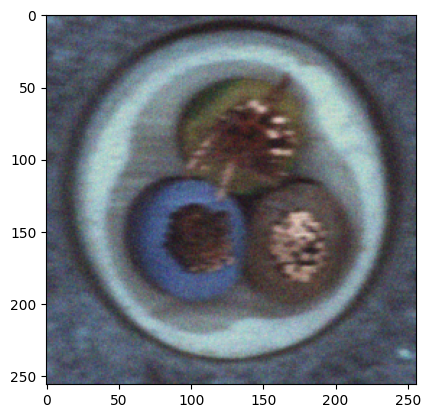

In [ ]:
plt.imshow(test_image)

In [ ]:
test_image=resize(test_image)
test_image.size

(256, 256)

In [ ]:
test_image=np.array(test_image)

In [ ]:
torch.tensor(test_image.transpose(2, 0, 1)).unsqueeze(dim=0)

tensor([[[[128, 121,  94,  ...,  95, 116,  81],
          [105, 100,  91,  ...,  90, 102,  95],
          [113, 102, 102,  ..., 106, 115,  89],
          ...,
          [ 87,  83,  76,  ...,  82,  80,  93],
          [ 83,  81,  74,  ...,  87,  81,  79],
          [ 79,  75,  88,  ...,  76,  84, 104]],

         [[148, 115, 132,  ..., 123, 107, 130],
          [131, 108, 122,  ..., 111, 100, 117],
          [137, 134, 128,  ..., 103,  97, 102],
          ...,
          [ 90,  98,  85,  ..., 101,  78,  75],
          [ 74,  99,  97,  ..., 113, 103,  85],
          [ 99,  83,  79,  ..., 103,  94, 100]],

         [[163, 153, 142,  ..., 132, 122, 124],
          [157, 153, 147,  ..., 141, 138, 142],
          [157, 165, 162,  ..., 139, 149, 148],
          ...,
          [104, 100,  93,  ..., 119, 101, 103],
          [115, 118, 111,  ..., 123, 120, 140],
          [118, 115, 112,  ..., 124, 128, 118]]]], dtype=torch.uint8)

In [ ]:
model2.eval()
with torch.inference_mode():
  for noisy, clean in train_dataloader:
      a=noisy[12].unsqueeze(dim=0).to(device)
      b=clean[12].unsqueeze(dim=0).to(device)

      recons=model2(a)
      break


In [ ]:
recons[0].shape

torch.Size([3, 256, 256])

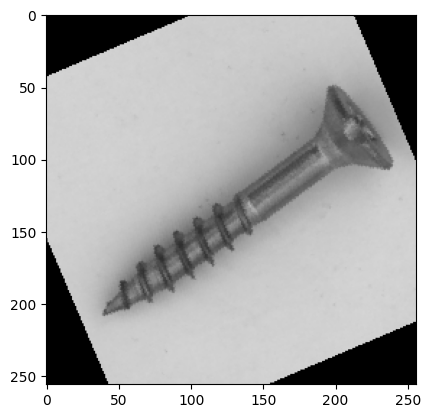

In [ ]:
plt.imshow(b[0].cpu().numpy().transpose(1,2,0))

In [ ]:
recons=recons[0].cpu().numpy()

In [ ]:
recons.shape

(3, 256, 256)

In [ ]:
torch.max(a), torch.min(b)

(tensor(0.9216, device='cuda:0'), tensor(0., device='cuda:0'))

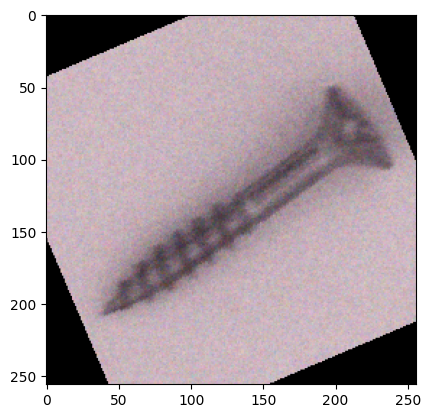

In [ ]:
plt.imshow(a[0].cpu().numpy().transpose(1,2,0))

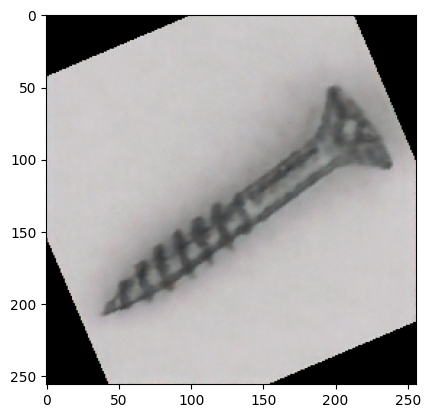

In [ ]:
plt.imshow(recons.transpose(1, 2, 0))

#Testing our model: finding the psnr for the entire validation data as well as for individual objects

In [35]:
import torch.nn.functional as F
def psnr(img1, img2, max_pixel_value=1.0): #this will give us the psnr value per image for a given batch, we'll have to eventually divide the outcome by total no. of batches
    mse = F.mse_loss(img1, img2)
    psnr_value = 20 * torch.log10(max_pixel_value / torch.sqrt(mse))
    return psnr_value


In [36]:
#first we'll have to load the test images
degraded_val_image_paths=get_image_path(root=os.getcwd(), folder="Val", type="Degraded_image")
clean_val_image_paths=get_image_path(root=os.getcwd(), folder="Val", type="GT_clean_image")

zeroeth print statement
['metal_nut', 'transistor', 'zipper', 'screw', 'tile', 'pill', 'toothbrush', 'leather', 'wood', 'hazelnut', 'cable', 'capsule', 'carpet', 'grid', 'bottle']
zeroeth print statement
['metal_nut', 'transistor', 'zipper', 'screw', 'tile', 'pill', 'toothbrush', 'leather', 'wood', 'hazelnut', 'cable', 'capsule', 'carpet', 'grid', 'bottle']


In [37]:
len(degraded_val_image_paths), len(clean_val_image_paths)

(88, 88)

In [38]:
test_dataset = SimpleDataset(degraded_val_image_paths, clean_val_image_paths)
test_dataloader = DataLoader(test_dataset, batch_size=len(degraded_val_image_paths), shuffle=False, num_workers=0) #taking batch size of one so that we can simply divide the final score by 88

In [39]:
print(device)

cuda


In [40]:
len(test_dataloader.dataset)

88

####Loading the saved model

In [ ]:
#loading our saved model
model2.load_state_dict(torch.load("DnCNN_model_135_epochs_augmenteted.pth"))

<ipython-input-60-3f16e2d0569a>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model2.load_state_dict(torch.load("DnCNN_model_135_epochs_augmenteted.pth"))


<All keys matched successfully>

#### PSNR For the validation set as well as for individual objects

In [86]:
#now let us test our model
model2.eval()
with torch.inference_mode():
    total_loss = 0
    for noisy, clean in test_dataloader:
        noisy, clean = noisy.to(device), clean.to(device)
        reconstructed = model2(noisy)

        # PSNR calculation for images in range [0,1]
        loss = psnr(reconstructed, clean, 1.0)  # Note max_pixel=1.0
        total_loss += loss

print(f"Average PSNR for the entire validation set: {total_loss:.2f} dB")

Average PSNR for the entire validation set: 28.99 dB


Sample outputs and PSNR/SSIM values (object-wise and overall) on the validation set: You can plot a
bar chart showing PSNR/SSIM values for each object. Arrange the objects on the X-axis in alphabetical
order of their names (bottle first, cable second, …). Also, report the average PSNR/SSIM value for the
entire validation set.

In [ ]:
#how to sample for each object?
#well we can use the sample function that we used before to load the objects one by one
#first let us get a list of all the objects present in the validation dataset
#then for these each individual objects, we can try and pass them to the model and find the psnr

In [87]:
def get_object_names(root): #returns paths of all the images of a given object
 root=root+"/drive/MyDrive"
 dataset_path=os.path.join(root, "Denoising_Dataset_train_val")
 object_names=[]

 for object in sorted(os.listdir(dataset_path)):
  object_names.append(object)

 return object_names

objects=get_object_names(os.getcwd())
objects

['bottle',
 'cable',
 'capsule',
 'carpet',
 'grid',
 'hazelnut',
 'leather',
 'metal_nut',
 'pill',
 'screw',
 'tile',
 'toothbrush',
 'transistor',
 'wood',
 'zipper']

In [88]:
def get_paths_of_an_object(root, object_name, folder="Val", type="Degraded_image" ): #returns paths of all the images of a given object
 root=root+"/drive/MyDrive"
 dataset_path=os.path.join(root, "Denoising_Dataset_train_val")
 image_paths=[]

 for object in sorted(os.listdir(dataset_path)):
  if object==object_name:
    object_directory_path=os.path.join(root, "Denoising_Dataset_train_val", object)
    # print("First print statement")
    # print(os.listdir(object_directory_path))


    for train_folder in sorted(os.listdir(object_directory_path)):
      if(train_folder==folder): #validation folder
        train_directory_path=os.path.join(root, "Denoising_Dataset_train_val", object, train_folder)
        # print("second print staement")
        # print(os.listdir(train_directory_path))

        for degraded_image_folder in os.listdir(train_directory_path):
            if(degraded_image_folder==type):

                image_folder_path=os.listdir(os.path.join(root, "Denoising_Dataset_train_val", object, train_folder, degraded_image_folder))
                # print("third print statement")
                # print(image_folder_path)
                # return []
                for image_folder in sorted(image_folder_path):
                    #inside each image folder, get the images and store them in images list
                    # print(image_folder_path)
                    image_path=os.listdir(os.path.join(root, "Denoising_Dataset_train_val", object, train_folder, degraded_image_folder, image_folder))
                    # print("fourth print statement")
                    # image_path.sort()
                    # print(image_path)
                    # return []
                    for image in sorted(image_path):
                        #now we need to store these images in a list so that they can be accessed later
                        image_paths.append(os.path.join(root, "Denoising_Dataset_train_val", object, train_folder, degraded_image_folder, image_folder, image))
 return image_paths

code for psnr on each object

In [89]:
psnr_scores=[]

In [90]:
model2.eval()
with torch.inference_mode():

    for object in objects:
        degraded_object_image_paths=get_paths_of_an_object(os.getcwd(), object)
        clean_object_image_paths=get_paths_of_an_object(os.getcwd(), object, "Val", "GT_clean_image")

        #first we must load the images and then apply appropriate transformations before passing the degraded images to the model
        #finally we can calculate the psnr

        degraded_images=torch.zeros(len(degraded_object_image_paths), 3, 256, 256)
        for i, noisy_image in enumerate(degraded_object_image_paths):
            pil_image=Image.open(noisy_image)
            noisy=transform(pil_image)
            degraded_images[i]=noisy

        #same thing for clean_images
        clean_images=torch.zeros(len(clean_object_image_paths), 3, 256, 256)
        # print("clean images length is ", len(clean_images))
        for i, image in enumerate(clean_object_image_paths):
          # print('i is ', i)
          pil_image=Image.open(image)
          image=transform(pil_image)
          clean_images[i]=image

        reconstructed_images=model2(degraded_images.to(device))
        psnr_score=psnr(reconstructed_images, clean_images.to(device)).item()
        psnr_scores.append(psnr_score)
        print(f"psnr for {object} is ", psnr_score)


psnr for bottle is  30.917558670043945
psnr for cable is  27.989429473876953
psnr for capsule is  28.228321075439453
psnr for carpet is  24.605865478515625
psnr for grid is  27.418930053710938
psnr for hazelnut is  33.3358039855957
psnr for leather is  29.60137176513672
psnr for metal_nut is  29.344730377197266
psnr for pill is  32.306278228759766
psnr for screw is  30.543190002441406
psnr for tile is  25.81369400024414
psnr for toothbrush is  31.054271697998047
psnr for transistor is  31.021251678466797
psnr for wood is  28.039216995239258
psnr for zipper is  31.550018310546875


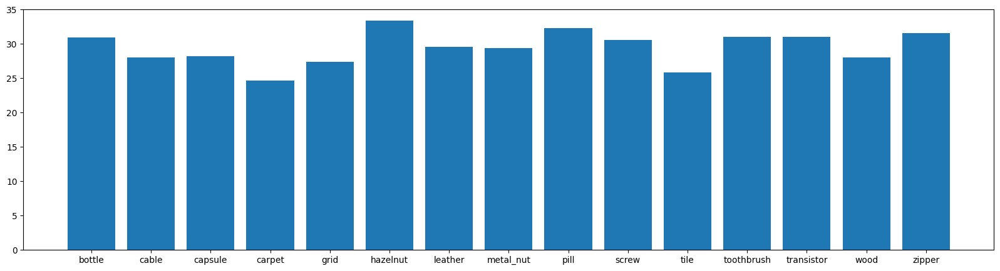

In [91]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20, 5))
plt.bar(objects, psnr_scores)
plt.show()

####SSIM Score for each object as well as the test set

In [47]:
from skimage import io
from skimage.metrics import structural_similarity as ssim

In [97]:
individual_objects_ssim_scores=[]

In [98]:
model2.eval()
with torch.inference_mode():

    for object in objects:
        ssim_scores=[] #stores the ssim for each image and then finally we can compute the mean from this
        degraded_object_image_paths=get_paths_of_an_object(os.getcwd(), object, "Val")
        clean_object_image_paths=get_paths_of_an_object(os.getcwd(), object, "Val", "GT_clean_image")

        #first we must load the images and then apply appropriate transformations before passing the degraded images to the model
        #finally we can calculate the psnr

        degraded_images=torch.zeros(len(degraded_object_image_paths), 3, 256, 256)
        for i, noisy_image in enumerate(degraded_object_image_paths):
            pil_image=Image.open(noisy_image)
            noisy=transform(pil_image)
            degraded_images[i]=noisy

        #same thing for clean_images
        clean_images=torch.zeros(len(clean_object_image_paths), 3, 256, 256)
        # print("clean images length is ", len(clean_images))
        for i, image in enumerate(clean_object_image_paths):
          # print('i is ', i)
          pil_image=Image.open(image)
          image=transform(pil_image)
          clean_images[i]=image

        reconstructed_images=model2(degraded_images.to(device))

        #until here, we have the clean images and the reconstructed ones
        #now we need to compute the ssim individually, however keep in mind that the function ssim expects images like HxWxChannels
        for i, image in enumerate(reconstructed_images):
           reconstructed_np_image=image.cpu().numpy()
           clean_np_image=clean_images[i].cpu().numpy()

           ssim_score=ssim(reconstructed_np_image.transpose(1, 2, 0),  clean_np_image.transpose(1, 2, 0), win_size=3,channel_axis=2, data_range=1)

           ssim_scores.append(ssim_score)
        individual_objects_ssim_scores.append(np.mean(ssim_scores))
        print(f"ssim_score for {object} is ", np.mean(ssim_scores))


ssim_score for bottle is  0.9006868
ssim_score for cable is  0.8388695
ssim_score for capsule is  0.93440753
ssim_score for carpet is  0.7560946
ssim_score for grid is  0.7828691
ssim_score for hazelnut is  0.9268042
ssim_score for leather is  0.69299537
ssim_score for metal_nut is  0.81898135
ssim_score for pill is  0.9189075
ssim_score for screw is  0.9275673
ssim_score for tile is  0.699427
ssim_score for toothbrush is  0.89415497
ssim_score for transistor is  0.90144885
ssim_score for wood is  0.71169484
ssim_score for zipper is  0.76275474


In [99]:
len(individual_objects_ssim_scores)

15

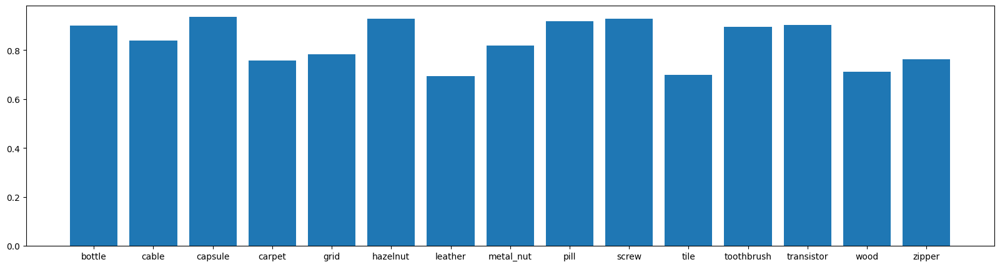

In [100]:
plt.figure(figsize=(20, 5))
plt.bar(objects, individual_objects_ssim_scores)
plt.show()

In [101]:
print("Average SSIM for the test set is ", np.mean(individual_objects_ssim_scores))

Average SSIM for the test set is  0.83117753
